In [1]:
import torch

In [2]:
device = "cuda"  if torch.cuda.is_available() else "cpu"
device

'cuda'

# Get Data

In [3]:
import requests
from pathlib import Path
import zipfile

data_path = Path("data/")
image_path_train = data_path / "train"
image_path_test = data_path / "test"

if image_path_train.is_dir():
  print(f"{image_path_train} directory exists.")
else:
  print(f"Did not find {image_path_train} directory, creating one...")
  image_path_train.mkdir(parents=True, exist_ok=True)

if image_path_test.is_dir():
  print(f"{image_path_test} directory exists.")
else:
  print(f"Did not find {image_path_test} directory, creating one...")
  image_path_test.mkdir(parents=True, exist_ok=True)

Did not find data/train directory, creating one...
Did not find data/test directory, creating one...


In [4]:
!apt-get install git
!git init
!git remote add origin https://github.com/ThanawatRung/Durian_Ai.git
!git config core.sparseCheckout true
!echo "dataset_durian/" >> .git/info/sparse-checkout
!git pull origin main

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git is already the newest version (1:2.34.1-1ubuntu1.11).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
hint: Using 'master' as the name for the initial branch. This default branch name
hint: is subject to change. To configure the initial branch name to use in all
hint: of your new repositories, which will suppress this warning, call:
hint: 
hint: 	git config --global init.defaultBranch <name>
hint: 
hint: Names commonly chosen instead of 'master' are 'main', 'trunk' and
hint: 'development'. The just-created branch can be renamed via this command:
hint: 
hint: 	git branch -m <name>
Initialized empty Git repository in /content/.git/
remote: Enumerating objects: 3551, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 3551 (delta 0), reused 3 (delta 0), pack-reused 3546 (from 1)
Receiving objects: 100% (3551/3551), 

# Make class folder in train and test folder

In [5]:
import os

# Define source and destination paths
source_dir = "/content/dataset_durian"
train_dir = "/content/data/train"
test_dir = "/content/data/test"

# List of classes (folders)
classes = ['Algal_Spot', 'Leaf_Blight', 'Leaf_Spot', 'No_Disease']

for class_name in classes:
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

# Split the data for train and test 70,30

In [6]:
import shutil
from sklearn.model_selection import train_test_split

for class_name in classes:
    # Get all images from the class folder
    class_dir = os.path.join(source_dir, class_name)
    images = os.listdir(class_dir)
    images = [img for img in images if img.endswith(".jpg") or img.endswith(".png")]

    # Split images into train (70%) and test (30%)
    train_images, test_images = train_test_split(images, test_size=0.3, random_state=42)

    # Copy the images to the corresponding train/test directories
    for img in train_images:
        shutil.copy(os.path.join(class_dir, img), os.path.join(train_dir, class_name, img))

    for img in test_images:
        shutil.copy(os.path.join(class_dir, img), os.path.join(test_dir, class_name, img))

# Look at the amout of picture in folder

In [7]:
class_AlgalLeafSpot_train  = os.path.join(train_dir,classes[0])
images_AlgalLeafSpot_train = os.listdir(class_AlgalLeafSpot_train)
print(f"There are {len(images_AlgalLeafSpot_train)} images in {class_AlgalLeafSpot_train}")

There are 282 images in /content/data/train/Algal_Spot


In [8]:
class_AlgalLeafSpot_test  = os.path.join(test_dir,classes[0])
images_AlgalLeafSpot_test = os.listdir(class_AlgalLeafSpot_test)
print(f"There are {len(images_AlgalLeafSpot_test)} images in {class_AlgalLeafSpot_test}")

There are 122 images in /content/data/test/Algal_Spot


In [9]:
class_LeafBlight_train  = os.path.join(train_dir,classes[1])
images_LeafBlight_train = os.listdir(class_LeafBlight_train)
print(f"There are {len(images_LeafBlight_train)} images in {class_LeafBlight_train}")

There are 126 images in /content/data/train/Leaf_Blight


In [10]:
class_LeafBlight_test  = os.path.join(test_dir,classes[1])
images_LeafBlight_test = os.listdir(class_LeafBlight_test)
print(f"There are {len(images_LeafBlight_test)} images in {class_LeafBlight_test}")

There are 54 images in /content/data/test/Leaf_Blight


In [11]:
class_LeafSpot_train = os.path.join(train_dir,classes[2])
images_LeafSpot_train = os.listdir(class_LeafSpot_train)
print(f"There are {len(images_LeafSpot_train)} images in {class_LeafSpot_train}")

There are 270 images in /content/data/train/Leaf_Spot


In [12]:
class_LeafSpot_test = os.path.join(test_dir,classes[2])
images_LeafSpot_test = os.listdir(class_LeafSpot_test)
print(f"There are {len(images_LeafSpot_test)} images in {class_LeafSpot_test}")

There are 116 images in /content/data/test/Leaf_Spot


In [13]:
class_NoDisease_train = os.path.join(train_dir,classes[3])
images_NoDisease_train = os.listdir(class_NoDisease_train)
print(f"There are {len(images_NoDisease_train)} images in {class_NoDisease_train}")

There are 302 images in /content/data/train/No_Disease


In [14]:
class_NoDisease_test = os.path.join(test_dir,classes[3])
images_NoDisease_test = os.listdir(class_NoDisease_test)
print(f"There are {len(images_NoDisease_test)} images in {class_NoDisease_test}")

There are 130 images in /content/data/test/No_Disease


# Visualize an image

Image class: Leaf_Spot
Random image path: /content/data/train/Leaf_Spot/Leaf_Spot_5.jpg

Image height: 3024
Image width: 4032


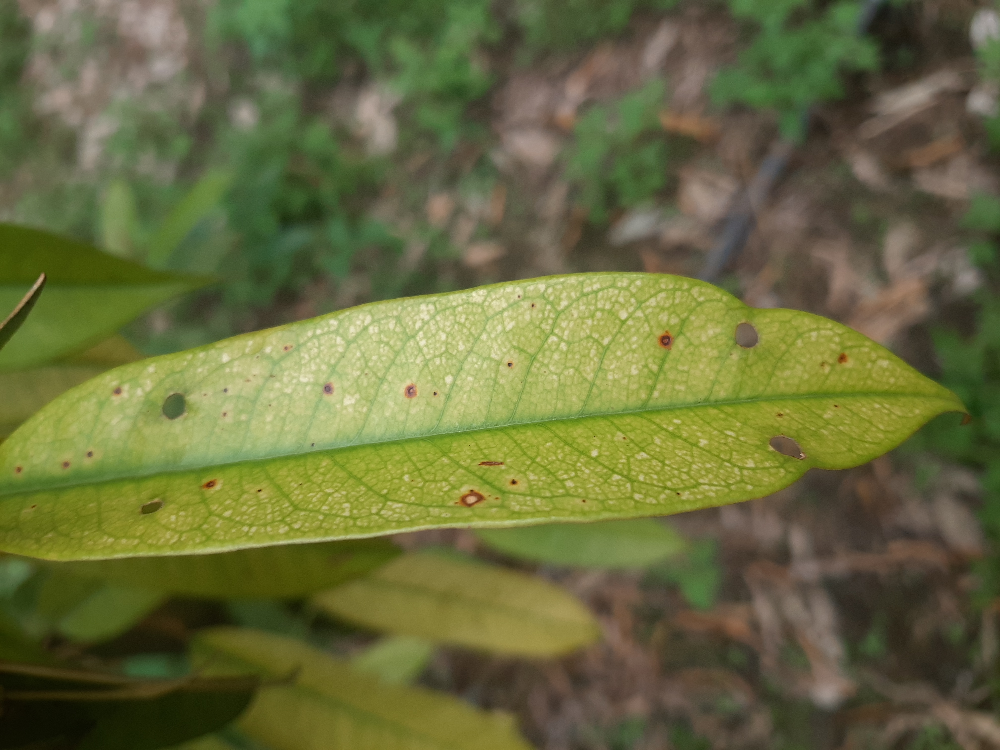

In [15]:
import random
from PIL import Image

#random.seed(42)

image_path_list = list(Path(class_LeafSpot_train).glob("*")) # can change class to look other image.
image_path = random.choice(image_path_list)

random_image_class = image_path.parent.stem
print(f"Image class: {random_image_class}")

img = Image.open(image_path)

# Print metadata
print(f"Random image path: {image_path}")
print(f"\nImage height: {img.height}")
print(f"Image width: {img.width}")
img

# Transforming data


In [16]:
from torchvision import transforms,datasets
from torch.utils.data import DataLoader

In [17]:
# Step 1: Calculate mean and standard deviation
initial_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

train_data = datasets.ImageFolder(root=image_path_train, transform=initial_transform)
train_dataloader = DataLoader(train_data, batch_size=32, shuffle=True)

# Initialize mean and std
mean = 0.0
std = 0.0
total_images = 0

# Calculate mean and std for training data
for images, _ in train_dataloader:
    batch_samples = images.size(0)  # Number of images in the batch
    images = images.view(batch_samples, images.size(1), -1)  # Reshape to (batch, channels, -1)
    mean += images.mean(2).sum(0)  # Sum over all pixels in the batch
    std += images.std(2).sum(0)  # Sum over all pixels in the batch
    total_images += batch_samples

mean /= total_images  # Final mean
std /= total_images  # Final std

print(f"Calculated Mean: {mean}")
print(f"Calculated Std: {std}")

Calculated Mean: tensor([0.4426, 0.5060, 0.3452])
Calculated Std: tensor([0.1857, 0.1694, 0.1756])


In [18]:
# Define transformations with augmentation
data_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(30),
    transforms.Resize((224, 224)),
    # Add Color Jitter (Helps with lighting variations)
    #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),

    # Add Random Perspective for slight image distortions
    #transforms.RandomPerspective(distortion_scale=0.5, p=0.5),

    # Add Random Affine for more diverse transformations
    transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=10),

    transforms.CenterCrop((180,120)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(mean[0].item(), mean[1].item(), mean[2].item()),
                         std=(std[0].item(), std[1].item(), std[2].item()))
])

In [19]:
# data_transform = transforms.Compose([
#     transforms.RandomHorizontalFlip(p=0.5),
#     transforms.RandomVerticalFlip(p=0.5),
#     transforms.RandomRotation(30),
#     transforms.Resize((224, 224)),

#     # Convert to grayscale (1 channel)
#     transforms.Grayscale(num_output_channels=1),

#     # Repeat the 1 channel to create 3 channels
#     transforms.Lambda(lambda x: x.repeat(3, 1, 1)),

#     # Add Random Affine for more diverse transformations
#     transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=10),

#     transforms.CenterCrop((180, 120)),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalization for 3 channels
# ])

In [20]:
data_transform(img).shape

torch.Size([3, 180, 120])

# Look at the picture that transform

In [21]:
from matplotlib import pyplot as plt

def plot_transformed_images(image_paths, transform, n=3, seed=None):
  """
  Selected random images from path of images and loads/transforms them
  then plots the original vs transformed version
  """

  if seed:
    random.seed(seed)
  random_image_paths = random.sample(image_paths, k=n)
  for image_path in random_image_paths:
    with Image.open(image_path) as f:
      fig, ax = plt.subplots(nrows=1,ncols=2)
      ax[0].imshow(f)
      ax[0].set_title(f"Original \nSize: {f.size}")
      ax[0].axis(False)

      #Transform and plot target image
      transformed_image = transform(f).permute(1,2,0) #note we will need to change  for matplotlib (C,H,W) -> (H,W,C)
      ax[1].imshow(transformed_image)
      ax[1].set_title(f"Transformed \nShape: {transformed_image.shape}")
      ax[1].axis(False)

      fig.suptitle(f"Class: {image_path.parent.stem}", fontsize=30)

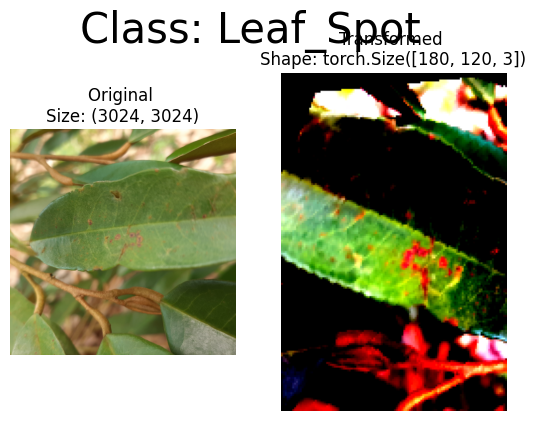

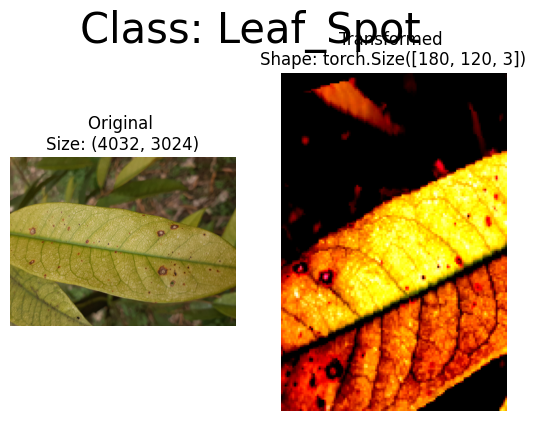

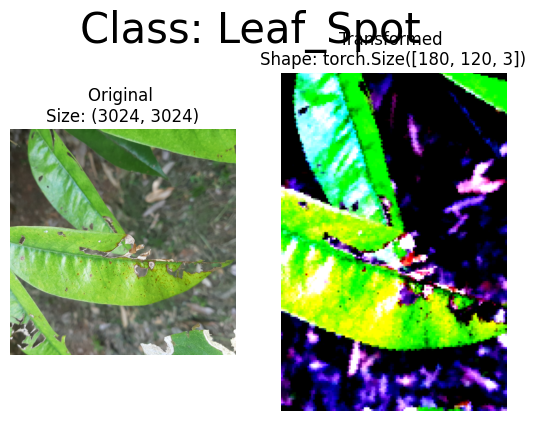

In [22]:
image_path_list = list(Path(class_LeafSpot_test).glob("*")) # can change class to look other image.
plot_transformed_images(image_path_list, data_transform)

# Loading image data

In [23]:
train_data = datasets.ImageFolder(root='/content/data/train',
                                  transform=data_transform, # a transform for the data
                                  target_transform=None) # a transform for the label/target

test_data = datasets.ImageFolder(root='/content/data/test',
                                 transform=data_transform,
                                 target_transform=None)

print(f"Train data:\n{train_data}\nTest data:\n{test_data}")

Train data:
Dataset ImageFolder
    Number of datapoints: 980
    Root location: /content/data/train
    StandardTransform
Transform: Compose(
               RandomHorizontalFlip(p=0.5)
               RandomVerticalFlip(p=0.5)
               RandomRotation(degrees=[-30.0, 30.0], interpolation=nearest, expand=False, fill=0)
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               RandomAffine(degrees=[-15.0, 15.0], translate=(0.1, 0.1), scale=(0.8, 1.2), shear=[-10.0, 10.0])
               CenterCrop(size=(180, 120))
               ToTensor()
               Normalize(mean=(0.44256481528282166, 0.5060197114944458, 0.3451829254627228), std=(0.18572920560836792, 0.16937066614627838, 0.17564328014850616))
           )
Test data:
Dataset ImageFolder
    Number of datapoints: 422
    Root location: /content/data/test
    StandardTransform
Transform: Compose(
               RandomHorizontalFlip(p=0.5)
               RandomVerticalFlip(p=0.5)


In [24]:
class_names = train_data.classes
class_names

['Algal_Spot', 'Leaf_Blight', 'Leaf_Spot', 'No_Disease']

In [25]:
class_dict = train_data.class_to_idx
class_dict

{'Algal_Spot': 0, 'Leaf_Blight': 1, 'Leaf_Spot': 2, 'No_Disease': 3}

In [26]:
len(train_data), len(test_data)

(980, 422)

In [27]:
train_data[0][0].shape

torch.Size([3, 180, 120])

# Turn data in to dataloader

In [28]:
BATCH_SIZE = 32
train_dataloader = DataLoader(dataset=train_data,
                              batch_size=BATCH_SIZE,
                              num_workers=1,
                              shuffle=True)

test_dataloader = DataLoader(dataset=test_data,
                             batch_size=BATCH_SIZE,
                             num_workers=1,
                             shuffle=False)

print(f"train_dataloader:{len(train_dataloader)},test_dataloader:{len(test_dataloader)}")
print(f"train_data:{len(train_data)},test_data:{len(test_data)}")


train_dataloader:31,test_dataloader:14
train_data:980,test_data:422


In [29]:
img,label = next(iter(train_dataloader))

# Batch size will now be 1 , you can change the batch size if you like
print(f"Image shape: {img.shape} -> [batch_size, color_channels, height, width]")
print(f"Label shape: {label.shape}")

Image shape: torch.Size([32, 3, 180, 120]) -> [batch_size, color_channels, height, width]
Label shape: torch.Size([32])


In [30]:
img,label

(tensor([[[[-1.6583e-01, -2.2918e-01, -3.5586e-01,  ..., -1.2849e+00,
            -1.0104e+00, -9.0484e-01],
           [-8.1376e-02, -1.4472e-01, -2.7141e-01,  ..., -1.1582e+00,
            -9.6818e-01, -8.8372e-01],
           [-1.0249e-01, -1.6583e-01, -1.6583e-01,  ..., -1.0526e+00,
            -9.4707e-01, -8.8372e-01],
           ...,
           [-9.6818e-01, -9.2595e-01, -9.0484e-01,  ..., -7.3592e-01,
            -6.7258e-01, -6.7258e-01],
           [-9.6818e-01, -9.4707e-01, -9.2595e-01,  ..., -6.9369e-01,
            -6.5147e-01, -6.3035e-01],
           [-9.4707e-01, -9.4707e-01, -9.4707e-01,  ..., -6.5147e-01,
            -6.0924e-01, -5.8812e-01]],
 
          [[-9.3426e-02, -1.3973e-01, -2.3235e-01,  ..., -1.9689e+00,
            -1.7605e+00, -1.6447e+00],
           [-2.3965e-02, -7.0272e-02, -1.3973e-01,  ..., -1.8994e+00,
            -1.7142e+00, -1.5984e+00],
           [-7.0272e-02, -1.1658e-01, -1.1658e-01,  ..., -1.8531e+00,
            -1.6679e+00, -1.5984e+00],


# Create the model EfficientNet Transfer learning

In [31]:
from torch import nn
import torchvision
from torchvision import models
from sklearn.metrics import accuracy_score

class TransferLearningModel(nn.Module):
    def __init__(self, num_classes):
        super(TransferLearningModel, self).__init__()
        # Load the EfficientNet model (you can choose different versions like efficientnet_b0, efficientnet_b1, etc.)
        self.model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)

        # Replace the classifier to match the number of classes
        in_features = self.model.classifier[1].in_features  # Get the input features of the classifier layer
        self.model.classifier[1] = nn.Linear(in_features, num_classes)  # Update to match num_classes

    def forward(self, x):
        return self.model(x)

# Train model

In [32]:
from tqdm.auto import tqdm

num_classes = len(class_names)  # Adjust based on your dataset
model = TransferLearningModel(num_classes=num_classes)

# Hyperparameters
learning_rate = 0.001
num_epochs = 5

# Initialize loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Training loop
for epoch in tqdm(range(num_epochs)):
    model.train()
    running_loss = 0.0
    correct_preds = 0
    total_preds = 0

    for images, labels in train_dataloader:
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total_preds += labels.size(0)
        correct_preds += (predicted == labels).sum().item()

    epoch_loss = running_loss / len(train_data)
    epoch_accuracy = correct_preds / total_preds

    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}')

    # Evaluation
    model.eval()
    all_labels = []
    all_preds = []

    with torch.inference_mode():
        for images, labels in test_dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    print(f'Test Accuracy: {accuracy:.4f}')

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 69.6MB/s]


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5, Loss: 0.4399, Accuracy: 0.8429
Test Accuracy: 0.9573
Epoch 2/5, Loss: 0.1893, Accuracy: 0.9398
Test Accuracy: 0.9645
Epoch 3/5, Loss: 0.1218, Accuracy: 0.9602
Test Accuracy: 0.9526
Epoch 4/5, Loss: 0.1313, Accuracy: 0.9633
Test Accuracy: 0.9716
Epoch 5/5, Loss: 0.0844, Accuracy: 0.9704
Test Accuracy: 0.9763


In [33]:
prediction = model(img.to(device))

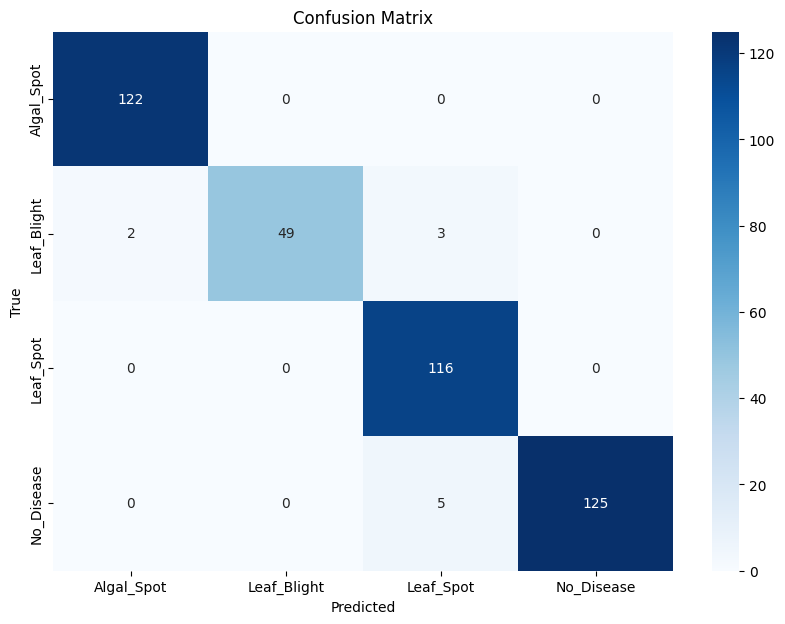

In [34]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the confusion matrix
cm = confusion_matrix(all_labels, all_preds, labels=list(range(num_classes)))

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [35]:
model.eval()
all_labels = []
all_preds = []

with torch.inference_mode():
    for images, labels in test_dataloader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)

        y_prob = torch.nn.functional.softmax(outputs, dim=1)
        print(y_prob)

        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

        print('---------------------------')
        print(labels.cpu().numpy())
        print(predicted.cpu().numpy())
        print('---------------------------')


tensor([[9.9999e-01, 2.7433e-07, 3.8204e-07, 5.1864e-06],
        [9.9999e-01, 2.1365e-06, 2.1283e-07, 2.9161e-06],
        [9.8741e-01, 5.9601e-03, 1.9231e-03, 4.7117e-03],
        [9.9988e-01, 2.8863e-05, 5.4177e-05, 3.4270e-05],
        [9.9997e-01, 2.0924e-05, 6.0507e-06, 4.5933e-06],
        [9.9998e-01, 4.0005e-07, 3.7999e-06, 1.2530e-05],
        [9.9989e-01, 2.8865e-05, 7.3240e-06, 7.8811e-05],
        [9.9956e-01, 2.5961e-04, 1.3839e-05, 1.6933e-04],
        [9.9979e-01, 4.2163e-06, 1.0626e-06, 2.0403e-04],
        [9.9905e-01, 3.8834e-04, 1.8204e-04, 3.8433e-04],
        [1.0000e+00, 2.7268e-08, 1.3299e-08, 7.8736e-07],
        [9.9999e-01, 4.1467e-06, 5.7742e-07, 1.5319e-06],
        [9.9994e-01, 1.3159e-06, 5.0741e-05, 9.2526e-06],
        [9.9995e-01, 9.4713e-07, 5.7870e-06, 4.0873e-05],
        [9.9984e-01, 1.3444e-05, 5.6239e-05, 8.7551e-05],
        [9.9471e-01, 2.8834e-03, 6.2574e-04, 1.7840e-03],
        [9.2816e-01, 1.9628e-02, 3.4895e-02, 1.7319e-02],
        [9.975

In [45]:
# Define transformations with augmentation
data_transform_predict = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.CenterCrop((180,120)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(mean[0].item(), mean[1].item(), mean[2].item()),
                         std=(std[0].item(), std[1].item(), std[2].item()))
])

# Calculated Mean: tensor([0.4440, 0.5052, 0.3452])
# Calculated Std: tensor([0.1859, 0.1692, 0.1759])

image_path = '/content/att.5SSu7luf9XXEqniwwnqOJZRE-LBFgy8mubTcLjNdF0A.jpg'
image = Image.open(image_path)
input_tensor = data_transform_predict(image)  # Assuming data_transform is defined
input_batch = input_tensor.unsqueeze(0)  # Create a batch of size 1

# Move the model and the input to the correct device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
input_batch = input_batch.to(device)

# Make the prediction
with torch.no_grad():
    output = model(input_batch)  # Get model output (logits)
    _, predicted = torch.max(output.data, 1)

    y_prob = torch.nn.functional.softmax(output, dim=1)
    print(y_prob,predicted)


tensor([[0.8131, 0.0966, 0.0473, 0.0430]], device='cuda:0') tensor([0], device='cuda:0')


# Save the model

In [46]:
from pathlib import Path

MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, exist_ok=True)

MODEL_NAME = "Durian_Ai_2.pth"
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

print(f"Saving model to: {MODEL_SAVE_PATH}")
torch.save(obj=model.state_dict(),
           f=MODEL_SAVE_PATH)



Saving model to: models/Durian_Ai_2.pth


# Load model

In [48]:
device = "cuda"  if torch.cuda.is_available() else "cpu"

loading_model = TransferLearningModel(num_classes=4) # num_classes=4
loading_model.load_state_dict(torch.load("/content/models/Durian_Ai_2.pth")) # Path file that you save

loading_model = loading_model.to(device)

<ipython-input-48-40faca8f2806>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  loading_model.load_state_dict(torch.load("/content/models/Durian_Ai_2.pth")) # Path file tha